# Проект e-commerce: вариант 1

#### Файлы:

- **list_customers_dataset.csv** — таблица с уникальными идентификаторами пользователей
    - customer_id — позаказный идентификатор пользователя
    - customer_unique_id —  уникальный идентификатор пользователя  (аналог номера паспорта)
    - customer_zip_code_prefix —  почтовый индекс пользователя
    - customer_city —  город доставки пользователя
    - customer_state —  штат доставки пользователя


- **list_orders_dataset.csv** —  таблица заказов
    - order_id —  уникальный идентификатор заказа (номер чека)
    - customer_id —  позаказный идентификатор пользователя
    - order_status —  статус заказа
    - order_purchase_timestamp —  время создания заказа
    - order_approved_at —  время подтверждения оплаты заказа
    - order_delivered_carrier_date —  время передачи заказа в логистическую службу
    - order_delivered_customer_date —  время доставки заказа
    - order_estimated_delivery_date —  обещанная дата доставки


- **list_order_items_dataset.csv** —  товарные позиции, входящие в заказы
    - order_id —  уникальный идентификатор заказа (номер чека)
    - order_item_id —  идентификатор товара внутри одного заказа
    - product_id —  ид товара (аналог штрихкода)
    - seller_id — ид производителя товара
    - shipping_limit_date —  максимальная дата доставки продавцом для передачи заказа партнеру по логистике
    - price —  цена за единицу товара
    - freight_value —  вес товара

Уникальные статусы заказов в таблице **list_orders_dataset**:

- created —  создан
- approved —  подтверждён
- invoiced —  выставлен счёт
- processing —  в процессе сборки заказа
- shipped —  отгружен со склада
- delivered —  доставлен пользователю
- unavailable —  недоступен
- canceled —  отменён

Загружаем необходимые библиотеки:

In [1]:
import pandas as pd
import numpy as np

import datetime
from calendar import monthrange

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px

from operator import attrgetter

Считываем файлы и проверяем датафреймы, их размер и типы данных.

In [2]:
customers = pd.read_csv('/mnt/HC_Volume_18315164/home-jupyter/jupyter-v-agafonova/Data first_project/olist_customers_dataset.csv')
orders = pd.read_csv('/mnt/HC_Volume_18315164/home-jupyter/jupyter-v-agafonova/Data first_project/olist_orders_dataset.csv')
order_items = pd.read_csv('/mnt/HC_Volume_18315164/home-jupyter/jupyter-v-agafonova/Data first_project/olist_order_items_dataset.csv')

Проверим загруженные датафреймы, типы данных, наличие пропусков.

In [3]:
customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [4]:
customers.dtypes

customer_id                 object
customer_unique_id          object
customer_zip_code_prefix     int64
customer_city               object
customer_state              object
dtype: object

In [5]:
customers.isna().sum()

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

In [6]:
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [7]:
#проверим наличе пропусков
orders.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

Хоть пропуски присутствуют, в них есть логика. Так как колонки со временем - это по сути определённая последовательность действий *(создание заказа -> подтверждение оплаты -> передача в логистическую службу -> время доставки)*, каждое последующее действие не может наступить, пока не закончится предыдущее. В нашем датафрейме все заказы созданы, у них есть обещанная дата доставки, а это главное. Все, что находится между этими колонками - вполне рабочий процесс, заказы находятся на разном этапе своей доставки. Более подробно эти пропуски рассмотрим немного позже.

In [8]:
orders.dtypes

order_id                         object
customer_id                      object
order_status                     object
order_purchase_timestamp         object
order_approved_at                object
order_delivered_carrier_date     object
order_delivered_customer_date    object
order_estimated_delivery_date    object
dtype: object

Несколько колонок нужно перевести в datetime.

In [9]:
#так как колонки стоят подрд, заведём в переменную их срез
columns_todate = orders.columns[3:8]

#переведём колонки в datetime
orders[columns_todate] = orders[columns_todate].apply(pd.to_datetime)

#а ещё добавим новые колонки на основе order_purchase_timestamp, они понадобятся позже
orders['order_purchase_period'] = orders.order_purchase_timestamp.dt.to_period('M') #месяц и год заказа
orders['order_purchase_dayofweek'] = orders.order_purchase_timestamp.dt.day_name() #день недели заказа

In [10]:
# снова проверяем тип данных
orders.dtypes

order_id                                 object
customer_id                              object
order_status                             object
order_purchase_timestamp         datetime64[ns]
order_approved_at                datetime64[ns]
order_delivered_carrier_date     datetime64[ns]
order_delivered_customer_date    datetime64[ns]
order_estimated_delivery_date    datetime64[ns]
order_purchase_period                 period[M]
order_purchase_dayofweek                 object
dtype: object

In [11]:
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_purchase_period,order_purchase_dayofweek
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,2017-10,Monday
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,2018-07,Tuesday
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,2018-08,Wednesday
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,2017-11,Saturday
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,2018-02,Tuesday


In [12]:
order_items.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [13]:
order_items.dtypes

order_id                object
order_item_id            int64
product_id              object
seller_id               object
shipping_limit_date     object
price                  float64
freight_value          float64
dtype: object

В этой таблице также нужно перевести одну колонку в дату.

In [14]:
order_items['shipping_limit_date'] = pd.to_datetime(order_items['shipping_limit_date'])

In [15]:
# снова проверяем тип данных
order_items.dtypes

order_id                       object
order_item_id                   int64
product_id                     object
seller_id                      object
shipping_limit_date    datetime64[ns]
price                         float64
freight_value                 float64
dtype: object

In [16]:
order_items.isna().sum()

order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

## Проведём исследование, чтобы определиться, что считать покупкой.

Сначала о некоторых эмпирических наблюдениях. За каждлый факт оплаты чего-либо покупателю выдаётся чек. Заглянем, к примеру, в приложения всем известных маркетплейсов.
1. OZON сначла берёт с пользователя так называемый аванс (полную стоимость покупки). Настоящий чек о покупке с детализацией всех товаров прилетает уже после того, как ты забрал товар. Если товар не забрал, то деньги возвращаются, чек не прилетает. То есть покупкой в OZON считается только доставленный товар.
2. В Я.Маркете сразу после заказа и оплаты товара прилетает чек. Здесь покупкой считается факт оплаты.
3. На WB чек также приходит сразу после оплаты заказа.
4. У сбермегамаркета такая же модель, как и у OZON. Сначала чек о 100% предоплате, после получения - чек о покупке товаров.

**Следовательно, у нас есть два варианта:**
- купил, когда оплатил;
- купил, когда получил.

Рассмотрим оба варианта.

Купил, когда оплатил - это колонка `order_approved_at`, мы уже знаем, что там есть 160 пропусков. Отфильтруемся по ним и посмотрим на статусы заказов.

In [17]:
orders[orders.order_approved_at.isna()].order_status.value_counts()

canceled     141
delivered     14
created        5
Name: order_status, dtype: int64

- Отменённый заказ - точно считать покупкой нельзя;
- Созданный заказ - ещё не оплачен, будет ли - неизвестно, так что тоже нельзя;
- Нет времени подтверждения оплаты заказа, но заказ доставлен? Выглядит странно. Тут явная ошибка, только непонятно с какой колонкой. Либо не записался факт оплаты, либо сбой в статусе. Рассмотрим внимательнее.

In [18]:
orders[orders.order_approved_at.isna()].query("order_status == 'delivered'")

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_purchase_period,order_purchase_dayofweek
5323,e04abd8149ef81b95221e88f6ed9ab6a,2127dc6603ac33544953ef05ec155771,delivered,2017-02-18 14:40:00,NaT,2017-02-23 12:04:47,2017-03-01 13:25:33,2017-03-17,2017-02,Saturday
16567,8a9adc69528e1001fc68dd0aaebbb54a,4c1ccc74e00993733742a3c786dc3c1f,delivered,2017-02-18 12:45:31,NaT,2017-02-23 09:01:52,2017-03-02 10:05:06,2017-03-21,2017-02,Saturday
19031,7013bcfc1c97fe719a7b5e05e61c12db,2941af76d38100e0f8740a374f1a5dc3,delivered,2017-02-18 13:29:47,NaT,2017-02-22 16:25:25,2017-03-01 08:07:38,2017-03-17,2017-02,Saturday
22663,5cf925b116421afa85ee25e99b4c34fb,29c35fc91fc13fb5073c8f30505d860d,delivered,2017-02-18 16:48:35,NaT,2017-02-22 11:23:10,2017-03-09 07:28:47,2017-03-31,2017-02,Saturday
23156,12a95a3c06dbaec84bcfb0e2da5d228a,1e101e0daffaddce8159d25a8e53f2b2,delivered,2017-02-17 13:05:55,NaT,2017-02-22 11:23:11,2017-03-02 11:09:19,2017-03-20,2017-02,Friday
26800,c1d4211b3dae76144deccd6c74144a88,684cb238dc5b5d6366244e0e0776b450,delivered,2017-01-19 12:48:08,NaT,2017-01-25 14:56:50,2017-01-30 18:16:01,2017-03-01,2017-01,Thursday
38290,d69e5d356402adc8cf17e08b5033acfb,68d081753ad4fe22fc4d410a9eb1ca01,delivered,2017-02-19 01:28:47,NaT,2017-02-23 03:11:48,2017-03-02 03:41:58,2017-03-27,2017-02,Sunday
39334,d77031d6a3c8a52f019764e68f211c69,0bf35cac6cc7327065da879e2d90fae8,delivered,2017-02-18 11:04:19,NaT,2017-02-23 07:23:36,2017-03-02 16:15:23,2017-03-22,2017-02,Saturday
48401,7002a78c79c519ac54022d4f8a65e6e8,d5de688c321096d15508faae67a27051,delivered,2017-01-19 22:26:59,NaT,2017-01-27 11:08:05,2017-02-06 14:22:19,2017-03-16,2017-01,Thursday
61743,2eecb0d85f281280f79fa00f9cec1a95,a3d3c38e58b9d2dfb9207cab690b6310,delivered,2017-02-17 17:21:55,NaT,2017-02-22 11:42:51,2017-03-03 12:16:03,2017-03-20,2017-02,Friday


Судя по тому, что остальные этапы записаны, а факт подверждения оплаты - нет, ошибка именно в этой колонке и заказ действительно доставлен. Просто не записана дата оплаты. Значит, можно считать покупкой.

Теперь вернёмся к варианту **"купил, когда получил"**. Согласно этому варианту покупкой считается только статус `delivered` в `order_status`, а все остальные - нет. 

In [19]:
orders.query("order_status == 'delivered'").isna().sum()

order_id                          0
customer_id                       0
order_status                      0
order_purchase_timestamp          0
order_approved_at                14
order_delivered_carrier_date      2
order_delivered_customer_date     8
order_estimated_delivery_date     0
order_purchase_period             0
order_purchase_dayofweek          0
dtype: int64

C пропусками в `order_approved_at` мы разобрались выше. Их считать покупкой можно. Рассмотрим остальные. 

Фильруем заказы по статусу "доставлено", где не отмечено время передачи заказа в логистическую службу и/или время доставки заказа.

In [20]:
delivered_NaT = orders.query('order_status == "delivered" and \
            (order_delivered_customer_date.isna() or order_delivered_carrier_date.isna())')
delivered_NaT

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_purchase_period,order_purchase_dayofweek
3002,2d1e2d5bf4dc7227b3bfebb81328c15f,ec05a6d8558c6455f0cbbd8a420ad34f,delivered,2017-11-28 17:44:07,2017-11-28 17:56:40,2017-11-30 18:12:23,NaT,2017-12-18,2017-11,Tuesday
20618,f5dd62b788049ad9fc0526e3ad11a097,5e89028e024b381dc84a13a3570decb4,delivered,2018-06-20 06:58:43,2018-06-20 07:19:05,2018-06-25 08:05:00,NaT,2018-07-16,2018-06,Wednesday
43834,2ebdfc4f15f23b91474edf87475f108e,29f0540231702fda0cfdee0a310f11aa,delivered,2018-07-01 17:05:11,2018-07-01 17:15:12,2018-07-03 13:57:00,NaT,2018-07-30,2018-07,Sunday
73222,2aa91108853cecb43c84a5dc5b277475,afeb16c7f46396c0ed54acb45ccaaa40,delivered,2017-09-29 08:52:58,2017-09-29 09:07:16,NaT,2017-11-20 19:44:47,2017-11-14,2017-09,Friday
79263,e69f75a717d64fc5ecdfae42b2e8e086,cfda40ca8dd0a5d486a9635b611b398a,delivered,2018-07-01 22:05:55,2018-07-01 22:15:14,2018-07-03 13:57:00,NaT,2018-07-30,2018-07,Sunday
82868,0d3268bad9b086af767785e3f0fc0133,4f1d63d35fb7c8999853b2699f5c7649,delivered,2018-07-01 21:14:02,2018-07-01 21:29:54,2018-07-03 09:28:00,NaT,2018-07-24,2018-07,Sunday
92643,2d858f451373b04fb5c984a1cc2defaf,e08caf668d499a6d643dafd7c5cc498a,delivered,2017-05-25 23:22:43,2017-05-25 23:30:16,NaT,NaT,2017-06-23,2017-05,Thursday
97647,ab7c89dc1bf4a1ead9d6ec1ec8968a84,dd1b84a7286eb4524d52af4256c0ba24,delivered,2018-06-08 12:09:39,2018-06-08 12:36:39,2018-06-12 14:10:00,NaT,2018-06-26,2018-06,Friday
98038,20edc82cf5400ce95e1afacc25798b31,28c37425f1127d887d7337f284080a0f,delivered,2018-06-27 16:09:12,2018-06-27 16:29:30,2018-07-03 19:26:00,NaT,2018-07-19,2018-06,Wednesday


In [21]:
# заодно заведём переменную с айдишниками этих заказов

id_delivered_NaT = orders.query('order_status == "delivered" and \
            (order_delivered_customer_date.isna() or order_delivered_carrier_date.isna())').order_id

In [22]:
# и посмотрим на товары, входящие в эти заказы

order_items_NaT = order_items.query('order_id in @id_delivered_NaT')
order_items_NaT

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
5841,0d3268bad9b086af767785e3f0fc0133,1,ec165cd31c50585786ffda6feff5d0a6,8bdd8e3fd58bafa48af76b2c5fd71974,2018-07-05 21:29:54,188.99,15.63
14472,20edc82cf5400ce95e1afacc25798b31,1,55bfa0307d7a46bed72c492259921231,343e716476e3748b069f980efbaa294e,2018-07-03 16:29:30,45.90,9.07
18554,2aa91108853cecb43c84a5dc5b277475,1,44c2baf621113fa7ac95fa06b4afbc68,3f2af2670e104d1bcb54022274daeac5,2017-10-18 10:07:16,179.00,14.98
19642,2d1e2d5bf4dc7227b3bfebb81328c15f,1,a50acd33ba7a8da8e9db65094fa990a4,8581055ce74af1daba164fdbd55a40de,2017-12-04 17:56:40,117.30,17.53
19838,2d858f451373b04fb5c984a1cc2defaf,1,30b5b5635a79548a48d04162d971848f,f9bbdd976532d50b7816d285a22bd01e,2017-06-04 23:30:16,179.00,15.00
20393,2ebdfc4f15f23b91474edf87475f108e,1,e7d5464b94c9a5963f7c686fc80145ad,58f1a6197ed863543e0136bdedb3fce2,2018-07-05 17:15:12,139.00,19.07
75303,ab7c89dc1bf4a1ead9d6ec1ec8968a84,1,a2a7efc985315e86d4f0f705701b342b,ed4acab38528488b65a9a9c603ff024a,2018-06-18 12:30:35,110.99,9.13
101642,e69f75a717d64fc5ecdfae42b2e8e086,1,e7d5464b94c9a5963f7c686fc80145ad,58f1a6197ed863543e0136bdedb3fce2,2018-07-05 22:15:14,139.00,19.07
108192,f5dd62b788049ad9fc0526e3ad11a097,1,2167c8f6252667c0eb9edd51520706a1,0bb738e4d789e63e2267697c42d35a2d,2018-06-26 07:19:05,329.00,25.24


Допустим, строки в order_items присутствуют только для завершённых покупок. Тогда там не было бы строк для тех статусов, которые 100% не завершены. Это статусы `unavailable` и `canceled`. 

Проверим, есть ли там информация о товарах в отменённых или недоступных заказах.

In [23]:
# посмотрим на детали ещё недоставленных заказов, например, недоступных
id_unavailable = orders.query('order_status == "unavailable"').order_id

#посмотрим, есть ли строки в order_items
order_items_not_delivered = order_items.query('order_id in @id_unavailable')
order_items_not_delivered

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
11558,1a47da1d66c70489c8e35fe2b5433ab7,1,eba7488e1c67729f045ab43fac426f2e,620c87c171fb2a6dd6e8bb4dec959fc6,2016-10-11 18:53:48,249.90,20.85
20902,2fd1c83dd4714cf3cf796fffb6c8de62,1,17c7ec33a1657924ad493e6978b4bf91,3d01d1c414c44b5943a09619ff3853cb,2016-10-10 15:55:42,99.00,9.12
20903,2fd1c83dd4714cf3cf796fffb6c8de62,2,966a067b38634929844120e39b1576bc,61f159ef6da2d441951d2c0efa719362,2016-10-10 15:55:41,59.99,24.08
26470,3c3ca08854ca922fe8e9cedfd6841c8a,1,ac6c24af9f913c9375a3ea77883bda6e,5206cc4bc2297c833e6061c49bf9c43f,2016-10-12 13:21:35,35.00,10.96
34411,4dd47e84e6b8ff4a63d0b8425e6d788e,1,2aa489c905e1d41d8c716a6d6912d8c2,620c87c171fb2a6dd6e8bb4dec959fc6,2016-10-11 01:09:09,299.90,13.68
37340,54bb06e1ca86bd99ee2a8d6288bf4ede,1,bef13288a0f8b26d763411ced1dfa268,cf281cf8b7affbdfe751b29cc85580e1,2016-10-29 09:43:46,64.90,25.33
97008,dc18a044b56ed174037ca164cdf2e921,1,faa268ecc8a8434cb4ebee091b3222d6,f0563bacf40c311f1c4d3d6b67b8a7a7,2016-10-21 16:18:52,1199.00,28.78


In [24]:
#проделаем то же самое для отменённых
id_canceled = orders.query('order_status == "canceled"').order_id


order_items_canceled = order_items.query('order_id in @id_canceled')
order_items_canceled

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
84,00310b0c75bb13015ec4d82d341865a4,1,c8e7c2ef329fcda4a233e7e2f8bb8b7d,a2deecd5398f5df4987110c80a1972a3,2018-08-17 15:04:25,39.90,15.38
270,00ae7a8b4936674ebb701d4a23719a79,1,66f09a6de4f2ef63aaf5349b60a0e0c0,bf0d50a6410d487dc97d2baac0a8c0be,2018-05-15 15:51:32,27.90,9.26
422,00ff0cf5583758e6964723e42f111bf4,1,bb1fe952bdc16ef8974d4ca11aec19b7,b17b679f4f5ce2e03ce6968c62648246,2017-04-14 01:03:29,154.90,15.25
543,013e9c654a339d80b53513da3c1ea437,1,bcac2cdcd851929a5caa3e1508d5abc9,0adac9fbd9a2b63cccaac4f8756c1ca8,2017-06-22 13:55:18,109.90,13.11
558,0148d3df00cebda592d4e5f966e300cc,1,ed08ea04c92f5f434c2362f7310fb328,0adac9fbd9a2b63cccaac4f8756c1ca8,2017-08-24 19:24:32,5.53,11.85
...,...,...,...,...,...,...,...
110535,fb265b2dc558a56445dfc48f8224e201,1,baf25ed4f8f70238cc87230379471454,128f9bfbe4c7d5185033914b1de3d39a,2017-10-18 21:35:15,9.90,121.22
111019,fc3c882665c98c9b737a7b1b3aa6c553,1,44aadbb26d5c81d9846b0c48bc00d7a3,2528513dd95219a6013d4d05176e391a,2018-04-23 18:55:18,28.90,8.88
111703,fdbbb1715d0c62c714e2a8178b95dd54,1,1b43b0a6105ffaa6dae01356daec2657,cc419e0650a3c5ba77189a1882b7556a,2018-05-22 21:50:38,57.99,11.15
112073,fe9aa3b22b4d65ccbaffb57984bc12fb,1,e71589252b1fc69c5a7931ee5028ecf6,0432ead42b6c8a0bdf68154add917fdf,2017-11-21 19:50:28,39.90,7.78


Нет, в order_items есть инфа обо всех заказах, даже тех, которые точно нельзя считать покупками. 
Из-за этого мы не можем ни подтвердить, ни опровергнуть суждение, являются ли покупкой заказы со статусом "доставлено", где стоят NaT в `order_delivered_customer_date` и `order_delivered_carrier_date`.

Мы будем считать, что эти заказы всё же доставлены, просто даты не записались, как и в случае с `order_approved_at`. То есть все `delivered` == `покупка`.

Остаётся один момент, который хочется уточнить - это статус `invoiced` — выставлен счёт. Выставленный счёт == чек об оплате? Посмотрим на пропуски по этому статусу, хотя в первую очередь интересует именно время подтверждения оплаты заказа (`order_approved_at`).

In [25]:
orders.query('order_status == "invoiced"').isna().sum()

order_id                           0
customer_id                        0
order_status                       0
order_purchase_timestamp           0
order_approved_at                  0
order_delivered_carrier_date     314
order_delivered_customer_date    314
order_estimated_delivery_date      0
order_purchase_period              0
order_purchase_dayofweek           0
dtype: int64

Так как все заказы с выставленным счетом уже имеют факт оплаты, мы можем считать гипотезу *оплатил - купил* верной в данном случае.

Таким образом, мы будем считать **покупкой** следующие статусы заказов:
- **approved** — подтверждён
- **invoiced** — выставлен счёт
- **processing** — в процессе сборки заказа
- **shipped** — отгружен со склада
- **delivered** — доставлен пользователю

Не считаем покупкой:
- created — создан
- unavailable — недоступен
- canceled — отменён

In [26]:
# добавим эти статусы в переменные для удобства

purchase = ['approved', 'invoiced', 'processing', 'shipped', 'delivered']
not_purchase = ['created', 'unavailable', 'canceled']

### 1. Сколько у нас пользователей, которые совершили покупку только один раз?

Здесь нужно разобраться, чем отличаются `customer_id` — позаказный идентификатор пользователя и `customer_unique_id` — уникальный идентификатор пользователя (аналог номера паспорта).

In [27]:
customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [28]:
print('Общее число строк: ', customers.shape[0])
print('Чисто уникальных customer_id: ', customers.customer_id.nunique())
print('Чисто уникальных customer_unique_id: ', customers.customer_unique_id.nunique())
print('Разница: ', customers.customer_id.nunique() - customers.customer_unique_id.nunique())

Общее число строк:  99441
Чисто уникальных customer_id:  99441
Чисто уникальных customer_unique_id:  96096
Разница:  3345


По всей видимости, на `customer_unique_id` приходится несколько `customer_id`. Пропусков в этой колонке нет, мы проверяли это в самом начале. 

Найдём количество дубликатов c помощью метода duplicated().

In [29]:
duplicates = customers[customers.customer_unique_id.duplicated()].shape[0]
print('Найдено {} совпадений.'.format(duplicates))

Найдено 3345 совпадений.


Количество совпадений такое же. На всякий случай посмотрим на них.

In [30]:
customers[customers.customer_unique_id.duplicated(keep = False)].sort_values('customer_unique_id').head(6)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
35608,24b0e2bd287e47d54d193e7bbb51103f,00172711b30d52eea8b313a7f2cced02,45200,jequie,BA
19299,1afe8a9c67eec3516c09a8bdcc539090,00172711b30d52eea8b313a7f2cced02,45200,jequie,BA
20023,1b4a75b3478138e99902678254b260f4,004288347e5e88a27ded2bb23747066c,26220,nova iguacu,RJ
22066,f6efe5d5c7b85e12355f9d5c3db46da2,004288347e5e88a27ded2bb23747066c,26220,nova iguacu,RJ
72451,49cf243e0d353cd418ca77868e24a670,004b45ec5c64187465168251cd1c9c2f,57055,maceio,AL
87012,d95f60d70d9ea9a7fe37c53c931940bb,004b45ec5c64187465168251cd1c9c2f,57035,maceio,AL


Грубо говоря, у некоторых людей на один "паспорт" есть два аккаунта в приложении.

Также колонка `customer_id` есть в **`orders`**. Посчитаем количество айдишников там.

In [31]:
print('Общее число строк: ', orders.shape[0])
print('Чисто уникальных customer_id: ', orders.customer_id.nunique())

Общее число строк:  99441
Чисто уникальных customer_id:  99441


Все `customer_id` также уникальны, поэтому можем сджойнить таблицы, но считать количество пользователей будем по `customer_unique_id`.

In [32]:
#прилепим customer_unique_id к таблице с заказами
orders_customers = orders.merge(customers[['customer_id', 'customer_unique_id']], on = 'customer_id')
orders_customers.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_purchase_period,order_purchase_dayofweek,customer_unique_id
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,2017-10,Monday,7c396fd4830fd04220f754e42b4e5bff
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,2018-07,Tuesday,af07308b275d755c9edb36a90c618231
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,2018-08,Wednesday,3a653a41f6f9fc3d2a113cf8398680e8
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,2017-11,Saturday,7c142cf63193a1473d2e66489a9ae977
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,2018-02,Tuesday,72632f0f9dd73dfee390c9b22eb56dd6


In [33]:
#самопроверка на отсутсвтие потерь
orders_customers.shape

(99441, 11)

In [34]:
#наконец, ответим на заданный вопрос

just_one_purchase = orders_customers.query('order_status == @purchase') \
                                    .groupby('customer_unique_id', as_index = False) \
                                    .agg({'order_id' : 'count'}) \
                                    .rename(columns={'order_id' : 'number_of_purchases'}) \
                                    .query('number_of_purchases == 1') \
                                    .shape[0]

dole = just_one_purchase / orders_customers.shape[0]

print('Найдено {} пользователей, совершивших только одну покупку.'.format(just_one_purchase))
print('Это {:.2%} от всех покупок.'.format(dole))

Найдено 92099 пользователей, совершивших только одну покупку.
Это 92.62% от всех покупок.


### 2. Сколько заказов в месяц в среднем не доставляется по разным причинам (вывести детализацию по причинам)?

Покупкой мы не считаем три статуса: `unavailable`, `canceled` и `created`. В этом вопросе последний нам не понадобится, потому что он может быть как оплачен в дальнейшем, так и отменён. Первые два статуса рассмотрим подробнее.

Сначала посмотрим на общую ситуацию по отменённым и недоступным заказам по месяцам

In [35]:
undelivered_orders = orders.query("order_status == 'unavailable' or order_status == 'canceled'") \
                           .groupby(['order_status', 'order_purchase_period'], as_index = False) \
                           .agg({'order_id':'count'}) \
                           .groupby('order_status', as_index = False) \
                           .agg({'order_id' : 'mean'}) \
                           .rename(columns = {'order_id' : 'undelivered_orders'})

#отфильтровались по отменённым и недоступным заказам
#сгруппировались по статусу и периоду (год-месяц) и посчитали количество строчек
#снова сгруппировались по статусу и посчитали среднее
undelivered_orders

,order_status,undelivered_orders
0,canceled,26.041667
1,unavailable,29.000000


**Ответ:** среднее количество отменённых заказов в месяц - 26, недоступных - 29. Визуализируем это.

In [36]:
undelivered_boxplot = orders.query("order_status == 'unavailable' or order_status == 'canceled'") \
                           .groupby(['order_status', 'order_purchase_period'], as_index = False) \
                           .agg({'order_id':'count'}) \
                           .rename(columns = {'order_id' : 'undelivered_orders'})

In [37]:
fig = px.box(undelivered_boxplot, x="order_status", y="undelivered_orders")
fig.show()

### 3. По каждому товару определить, в какой день недели товар чаще всего покупается.

Здесь в таблице **`orders`** оставим только покупки, айдишники заказов и дни недели покупок. Затем сджойним эту таблицу с **`order_items`** по `order_id`.

In [38]:
products = orders.query('order_status in @purchase')[['order_id', 'order_purchase_dayofweek']] \
                 .merge(order_items[['order_id', 'product_id']], on = 'order_id')

#завела дополнительную колонку-счётчик, по которой будем считать покупки
products['count'] = 1
products.head()

,order_id,order_purchase_dayofweek,product_id,count
0,e481f51cbdc54678b7cc49136f2d6af7,Monday,87285b34884572647811a353c7ac498a,1
1,53cdb2fc8bc7dce0b6741e2150273451,Tuesday,595fac2a385ac33a80bd5114aec74eb8,1
2,47770eb9100c2d0c44946d9cf07ec65d,Wednesday,aa4383b373c6aca5d8797843e5594415,1
3,949d5b44dbf5de918fe9c16f97b45f8a,Saturday,d0b61bfb1de832b15ba9d266ca96e5b0,1
4,ad21c59c0840e6cb83a9ceb5573f8159,Tuesday,65266b2da20d04dbe00c5c2d3bb7859e,1


Для самопроверки посмотрим, сколько у нас товаров осталось в таблице, ведь в результирующей таблице должно остаться столько же.


In [39]:
unique_products = products.product_id.nunique()
print('Всего в таблице {} уникальных товаров.'.format(unique_products))

Всего в таблице 32729 уникальных товаров.


In [40]:
best_dayofweek = products.groupby(['product_id', 'order_purchase_dayofweek'], as_index = False) \
                         .agg({'count' : 'count'}) \
                         .groupby(['product_id'], as_index = False).max() \
                         .sort_values('count', ascending = False)

#группируемся по товару и дню недели
#cчитаем количество строк
#снова группируеся по товару, но теперь оставляем максимальное значение
#дополнительно сортируем по количеству покупок, чтобы вывести топ по продажам

best_dayofweek.head()

,product_id,order_purchase_dayofweek,count
8554,422879e10f46682990de24d770e7f83d,Wednesday,93
19599,99a4788cb24856965c36a24e339b6058,Wednesday,92
21959,aca2eb7d00ea1a7b8ebd4e68314663af,Wednesday,89
10789,53b36df67ebb7c41585e8d54d6772e08,Wednesday,76
7314,389d119b48cf3043d311335e499d9c6b,Wednesday,67


#### 4. Сколько у каждого из пользователей в среднем покупок в неделю (по месяцам)? 
*Не стоит забывать, что внутри месяца может быть не целое количество недель. Например, в ноябре 2021 года 4,28 недели. И внутри метрики это нужно учесть.*

Для начала посмотрим, какой диапазон времени охватывают наши заказы.

In [41]:
orders.order_purchase_timestamp.min()

Timestamp('2016-09-04 21:15:19')

In [42]:
orders.order_purchase_timestamp.max()

Timestamp('2018-10-17 17:30:18')

Итак, наш датасет охватывает период  с `2016-09-04` по `2018-10-17`. Попробуем это учесть при решении задачи.

In [43]:
#добавим колонки для года и месяца заказа
orders['order_purchase_year'] = orders.order_purchase_timestamp.dt.year #год заказа
orders['order_purchase_month'] = orders.order_purchase_timestamp.dt.month #месяц заказа

In [44]:
#добавим колонку количества дней в месяце
orders['number_of_days'] = orders.apply(lambda x : monthrange(x['order_purchase_year'], x['order_purchase_month'])[1], axis=1)

К сожалению, я не нашла ничего лучше и быстрее, чем заменить колонки вручную по заданному условию через метод loc.

*Пожалуйста, укажите в ревью, каким ещё способом это можно было сделать.*

In [45]:
orders.loc[(orders.order_purchase_period == '2016-09'), 'number_of_days'] = 27
orders.loc[(orders.order_purchase_period == '2018-10'), 'number_of_days'] = 17

In [46]:
#добавим колонку количества недель в месяце, округлив до двух знаков
orders['number_of_weeks'] = round(orders['number_of_days'] / 7, 2)

In [47]:
# оставляем только покупки
orders_purchase = orders.query('order_status in @purchase')

In [48]:
orders_purchase.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_purchase_period,order_purchase_dayofweek,order_purchase_year,order_purchase_month,number_of_days,number_of_weeks
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,2017-10,Monday,2017,10,31,4.43
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,2018-07,Tuesday,2018,7,31,4.43
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,2018-08,Wednesday,2018,8,31,4.43
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,2017-11,Saturday,2017,11,30,4.29
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,2018-02,Tuesday,2018,2,28,4.00


Как и в первом задании джойнимся по `customer_id`, но считать пользователей будем по `customer_unique_id`.

In [49]:
avg_orders = orders_purchase[['order_id', 'customer_id', 'order_purchase_period', 'number_of_weeks']] \
             .merge(customers[['customer_id', 'customer_unique_id']], on='customer_id')

Группируемся по айдишнику, месяцу и количеству недель, считаем количество заказов.

In [50]:
avg_orders = avg_orders.groupby(['customer_unique_id', 'order_purchase_period', 'number_of_weeks'], as_index = False) \
                      .agg({'order_id' : 'count'}) \
                      .rename(columns={'order_id' : 'count_orders'})

Добавляем колонку со средним количеством покупок в неделю по месяцам. И выкидываем ненужные колонки.

In [51]:
avg_orders['avg_orders_by_week'] = round(avg_orders['count_orders'] / avg_orders['number_of_weeks'], 2)

avg_orders_by_week = avg_orders.drop(columns = 'count_orders')

**Получаем датафрейм со среднем количеством покупок в неделю по месяцам для каждого пользователя.**

In [52]:
avg_orders_by_week.head()

,customer_unique_id,order_purchase_period,number_of_weeks,avg_orders_by_week
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05,4.43,0.23
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05,4.43,0.23
2,0000f46a3911fa3c0805444483337064,2017-03,4.43,0.23
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10,4.43,0.23
4,0004aac84e0df4da2b147fca70cf8255,2017-11,4.29,0.23


### 5. Используя pandas, проведи когортный анализ пользователей. В период с января по декабрь выяви когорту с самым высоким retention на 3й месяц.

Так как наш датафрейм охватывает только один полный год - 2017, то будем учитывать только его. Но еще захватим первые три месяца 2018 года, чтобы учесть retention на третий месяц и декабрьской когорты.

Для начала объединим датафрейм с покупками `orders_purchase` за нужный период и датафрейм `customers`, в котором по сути нас интересует только `customer_unique_id`.

In [53]:
cohort_analysis = orders_purchase.query('order_purchase_period >= "2017-01" and order_purchase_period <= "2018-03"') \
                                .merge(customers[['customer_id', 'customer_unique_id']], on = 'customer_id') \
                                .sort_values('order_purchase_period')

#тут дополнительно сортируемся по месяцу и году заказа, просто чтобы было симпатичней

In [54]:
cohort_analysis.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_purchase_period,order_purchase_dayofweek,order_purchase_year,order_purchase_month,number_of_days,number_of_weeks,customer_unique_id
7278,abbbf52551bc34cd52a7851c06dfca90,594ceaa56731ed8539ea1b5437d9e311,delivered,2017-01-26 23:20:31,2017-01-28 04:35:50,2017-03-17 09:45:32,2017-04-05 14:14:58,2017-03-14,2017-01,Thursday,2017,1,31,4.43,040e4df45a02c9d398c233227f207f67
24078,2f9d791088532b218b41f892cc16073b,937bb74713a47912471275b234236764,delivered,2017-01-05 13:48:48,2017-01-07 03:35:21,2017-01-11 16:08:53,2017-01-17 16:57:46,2017-02-13,2017-01,Thursday,2017,1,31,4.43,6222ef69df52b4ed71be551725551cc0
5202,d34e369fbc5cb753012079961b615121,c651c585480832aaefbec136aebe2afd,delivered,2017-01-23 14:58:00,2017-01-24 03:50:56,2017-01-24 13:10:27,2017-02-03 09:32:10,2017-03-02,2017-01,Monday,2017,1,31,4.43,9476d63d5d33e182ed23f661fda9214b
47639,4f821ef636d5a5eb870c9ae7b7d7654f,7cdb0e1dd6b7da9186fa0ddef12d9817,delivered,2017-01-29 23:52:27,2017-01-30 01:30:58,2017-01-31 10:24:45,2017-02-13 07:07:40,2017-03-07,2017-01,Sunday,2017,1,31,4.43,212bd1dca013e0b1e466c735ca6d3bf8
63507,8f1a2a26d4f0ed5608a8857e0e88b7ad,725053273ea08ee2997d63e7a36b984c,invoiced,2017-01-27 18:18:31,2017-01-28 10:32:58,NaT,NaT,2017-03-21,2017-01,Friday,2017,1,31,4.43,4e98cae79b0b943a40111a0c2b0a9e07


Причислим каждого нашему пользователя к когорте (`cohort`). Для этого группируемся по айдишнику пользователя и выбираем год-месяц их первого заказа.

In [55]:
cohort_analysis['cohort'] = cohort_analysis.groupby('customer_unique_id') \
                                           ['order_purchase_period'].transform('min')

Посчитаем уникальное количество пользователей для каждой когорты.

In [56]:
cohort_analysis = cohort_analysis.groupby(['cohort', 'order_purchase_period'], as_index=False) \
                                 .agg({'customer_unique_id' : 'nunique'}) \
                                 .rename(columns = {'customer_unique_id' : 'user_count'})

Добавим коноку, указывающую на количество периодов между месяцем когорты и месяцем события.

In [57]:
cohort_analysis['period_number']  = (cohort_analysis.order_purchase_period - cohort_analysis.cohort).apply(attrgetter('n'))

Перевернём таблицу.

In [58]:
cohort_analysis = cohort_analysis.pivot_table(
                                index='cohort', 
                                columns='period_number', 
                                values='user_count')

In [59]:
cohort_analysis.head()

period_number,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
cohort,,,,,,,,,,,,,,,
2017-01,753.0,3.0,2.0,1.0,3.0,1.0,3.0,1.0,1.0,NaN,3.0,1.0,5.0,3.0,1.0
2017-02,1690.0,4.0,5.0,2.0,7.0,2.0,4.0,3.0,2.0,3.0,2.0,5.0,2.0,3.0,NaN
2017-03,2571.0,13.0,9.0,10.0,9.0,4.0,4.0,8.0,9.0,2.0,10.0,3.0,6.0,NaN,NaN
2017-04,2326.0,14.0,5.0,4.0,7.0,6.0,8.0,7.0,7.0,4.0,6.0,2.0,NaN,NaN,NaN
2017-05,3541.0,17.0,17.0,14.0,11.0,12.0,15.0,5.0,9.0,9.0,9.0,NaN,NaN,NaN,NaN


In [60]:
# Запишем размер когорты размер когорты
cohort_size = cohort_analysis.iloc[:,0]

#считаем retention rate 
retention_matrix = cohort_analysis.divide(cohort_size, axis = 0).mul(100).round(2)

retention_matrix

period_number,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
cohort,,,,,,,,,,,,,,,
2017-01,100.0,0.40,0.27,0.13,0.40,0.13,0.40,0.13,0.13,NaN,0.40,0.13,0.66,0.40,0.13
2017-02,100.0,0.24,0.30,0.12,0.41,0.12,0.24,0.18,0.12,0.18,0.12,0.30,0.12,0.18,NaN
2017-03,100.0,0.51,0.35,0.39,0.35,0.16,0.16,0.31,0.35,0.08,0.39,0.12,0.23,NaN,NaN
2017-04,100.0,0.60,0.21,0.17,0.30,0.26,0.34,0.30,0.30,0.17,0.26,0.09,NaN,NaN,NaN
2017-05,100.0,0.48,0.48,0.40,0.31,0.34,0.42,0.14,0.25,0.25,0.25,NaN,NaN,NaN,NaN
2017-06,100.0,0.45,0.35,0.39,0.26,0.39,0.35,0.23,0.13,0.23,NaN,NaN,NaN,NaN,NaN
2017-07,100.0,0.52,0.34,0.24,0.29,0.21,0.31,0.10,0.18,NaN,NaN,NaN,NaN,NaN,NaN
2017-08,100.0,0.68,0.34,0.27,0.36,0.53,0.29,0.27,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09,100.0,0.69,0.54,0.29,0.44,0.22,0.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5]),
 <a list of 15 Text major ticklabel objects>)

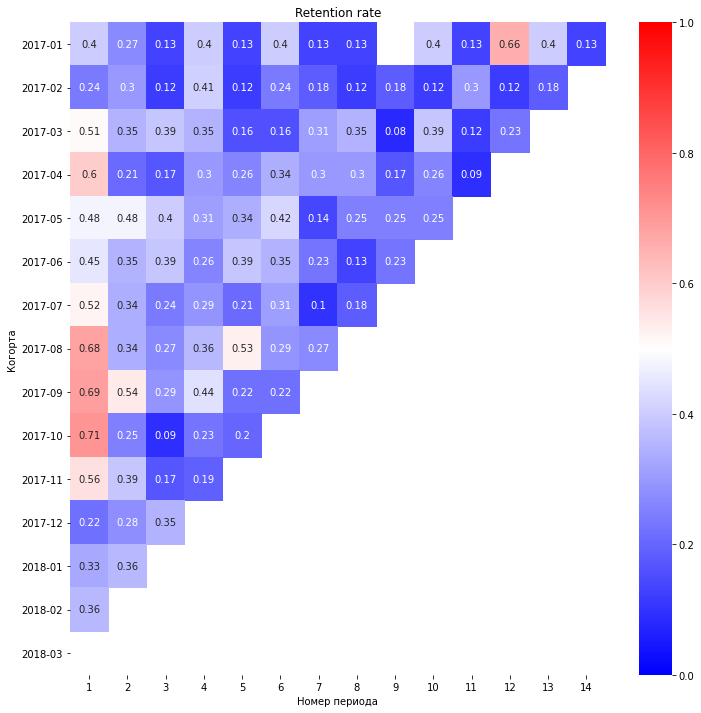

In [61]:
# Строим график, при этом выкинем первую колонку, так как в ней было деление числа на само себя
plt.figure(figsize=(12, 12))


ax = sns.heatmap(retention_matrix.iloc[:,1:], vmin=0, vmax=1, annot=True, cmap='bwr')

ax.set_title('Retention rate')
ax.set_xlabel('Номер периода')
ax.set_ylabel('Когорта')
plt.yticks(rotation=0)


**Самый высокий retention на третий месяц оказался у когорты 2017-05.**

### 6. Используя python, построй RFM-сегментацию пользователей, чтобы качественно оценить свою аудиторию. 
В кластеризации можешь выбрать следующие метрики: 
- R - время от последней покупки пользователя до текущей даты; 
- F - суммарное количество покупок у пользователя за всё время; 
- M - сумма покупок за всё время. 

Подробно опиши, как ты создавал кластеры. Для каждого RFM-сегмента построй границы метрик recency, frequency и monetary для интерпретации этих кластеров. Пример такого описания: RFM-сегмент 132 (recency=1, frequency=3, monetary=2) имеет границы метрик recency от 130 до 500 дней, frequency от 2 до 5 заказов в неделю, monetary от 1780 до 3560 рублей в неделю. Описание подхода можно найти тут. (35 баллов)


Чтобы получить RFM-оценку каждого клиента для начала нужно рассчитать оценки R, F, M от 1 до 3 (от худшего к лучшему).
1. рассчитать Recency = количество дней с момента последней покупки
2. рассчитать Freqency = количество покупок за исследуемый период (обычно один год)
3. рассчитать Monetary = общая сумма покупок, сделанных за исследуемый период
4. найти квинтили для каждого из этих измерений
5. дайте оценку каждому параметру в зависимости от того, в каком квинтиле он находится
6. объединить баллы R, F и M, чтобы получить балл RFM
7. сопоставить оценки RF с сегментами

Хочется охватить весь период, который охватывает этот датафрейм, а не только год.

Для начала сджойним все таблицы, оставив только интересующие столбцы.

In [64]:
rfm_analysis = orders_purchase[['order_id', 
                                'customer_id', 
                                'order_purchase_timestamp']] \
                .merge(customers[['customer_id', 
                                  'customer_unique_id']], 
                                   on = 'customer_id') \
                .merge(order_items[['order_id', 
                                    'product_id', 
                                    'price']], 
                                   on = 'order_id')

Посчитаем количество дней с момента покупки - `recency`.

In [65]:
# заводим меременную для последней даты
max_date = rfm_analysis['order_purchase_timestamp'].max()

#добавляем колонку
rfm_analysis['recency'] = rfm_analysis['order_purchase_timestamp'].apply(lambda day: (max_date - day).days)

# заводим под R отдельный датафрейм
r = rfm_analysis.groupby('customer_unique_id', as_index = False) \
                .agg({'recency' : 'min'})

In [66]:
r.head()

,customer_unique_id,recency
0,0000366f3b9a7992bf8c76cfdf3221e2,115
1,0000b849f77a49e4a4ce2b2a4ca5be3f,118
2,0000f46a3911fa3c0805444483337064,541
3,0000f6ccb0745a6a4b88665a16c9f078,325
4,0004aac84e0df4da2b147fca70cf8255,292


Рассчитаем `freqency` - количество покупок за исследуемый период.

In [67]:
f = rfm_analysis.groupby('customer_unique_id', as_index = False) \
                .agg({'order_id':'count'}) \
                .rename(columns={'order_id':'frequency'})

In [68]:
f.head()

,customer_unique_id,frequency
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1


Считаем `monetary`-  общую сумму покупок, сделанных за исследуемый период.

In [69]:
 m = rfm_analysis.groupby('customer_unique_id', as_index = False) \
                 .agg({'price':'sum'}) \
                 .rename(columns={'price':'monetary'})

In [70]:
m.head()

,customer_unique_id,monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,129.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,18.90
2,0000f46a3911fa3c0805444483337064,69.00
3,0000f6ccb0745a6a4b88665a16c9f078,25.99
4,0004aac84e0df4da2b147fca70cf8255,180.00


Джойним получившиеся датафреймы.

In [71]:
RFM = r.merge(f, on = 'customer_unique_id') \
       .merge(m, on = 'customer_unique_id')

In [72]:
RFM.head()

,customer_unique_id,recency,frequency,monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,115,1,129.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,118,1,18.90
2,0000f46a3911fa3c0805444483337064,541,1,69.00
3,0000f6ccb0745a6a4b88665a16c9f078,325,1,25.99
4,0004aac84e0df4da2b147fca70cf8255,292,1,180.00


Проведём базовую проверку на размер датафрема, отсутствие пропусков.

In [73]:
RFM.isna().sum()

customer_unique_id    0
recency               0
frequency             0
monetary              0
dtype: int64

In [74]:
unique_df = rfm_analysis.customer_unique_id.nunique()
new_df = RFM.shape[0]
print('Количество уникальных пользователей в исходном датафрейме : ', unique_df)
print('Количество уникальных пользователей в RFM-датафрейме : ', new_df)

Количество уникальных пользователей в исходном датафрейме :  94983
Количество уникальных пользователей в RFM-датафрейме :  94983


Посмотрим на описательную статистику RFM-датафрейма, чтобы определиться, к какой группе отнести пользователя.

In [75]:
RFM.describe()

,recency,frequency,monetary
count,94983.000000,94983.000000,94983.000000
mean,242.433077,1.180222,142.071747
std,152.983982,0.620593,216.074999
min,0.000000,1.000000,0.850000
25%,118.000000,1.000000,47.900000
50%,223.000000,1.000000,89.890000
75%,351.000000,1.000000,155.000000
max,728.000000,24.000000,13440.000000


In [76]:
RFM.median()

recency      223.00
frequency      1.00
monetary      89.89
dtype: float64

Изобразим на графике для наглядности распределение частот изучаемых показателей.

In [77]:
fig = px.histogram(RFM, x = 'recency', histnorm = 'probability density')
fig.show()

In [78]:
fig = px.histogram(RFM, x = 'frequency', histnorm = 'probability density')
fig.show()

In [79]:
fig = px.histogram(RFM, x = 'monetary', histnorm = 'probability density')
fig.show()

Сделаем несколько выводов на основе описательной статистики и графиков.

1. По дате последней покупки я бы разделила пользователей не на 3 группы, а на 5, так как охватываемый период больше года. Таблица получится не квадратной, но так, на мой взгяд, можно сегментировать аудиторию более подробно:
    - R1 - покупка больше года назад
    - R2 - покупка от полугода до года назад
    - R3 - покупка от месяца до полугода назад
    - R4 - покупка от недели до месяца назад
    - R5 - покупка до недели назад
2. В первом задании мы уже узнали, что больше 90 % всех пользователей совершили только один заказ, полученные результаты это подтверждают ещё раз. Для этого есть смысл разделять пользователей не по квантилям, а следующим образом:
    - F1 - совершившие одну покупку
    - F2 - совершившие две-три покупки
    - F3 - совершившие больше трёх покупок
3. По сумме покупок можно придерживаться квантилей:
    - M1 - 50% квантиль
    - M2 - до 75% квантиль
    - M3 - более 75% квантиль

In [80]:
# пишем функции для разделения пользователей 
#в соответствии с предложенными условиями

def r_score(x):
    if x >= 365:
        return 1
    elif x >= 183 and x < 365:
        return 2
    elif x > 30 and x <= 182:
        return 3
    elif x > 7 and x <= 30:
        return 4
    elif x <= 7:
        return 5

def f_score(x):
    if x == 1:
        return 1
    elif x == 2 or x == 3:
        return 2
    else:
        return 3
    
def m_score(x):
    if x <= RFM.monetary.quantile(q = 0.5):
        return 1
    elif x <= RFM.monetary.quantile(q = 0.75):
        return 2
    else:
        return 3

Преобразуем датафрейм с использованием новых функций.

In [81]:
RFM['R'] = RFM['recency'].apply(lambda x: r_score(x))
RFM['F'] = RFM['frequency'].apply(lambda x: f_score(x))
RFM['M'] = RFM['monetary'].apply(lambda x: m_score(x))

In [82]:
RFM['RFM_score'] = RFM['R'].map(str) + RFM['F'].map(str) + RFM['M'].map(str)

In [83]:
RFM.head()

,customer_unique_id,recency,frequency,monetary,R,F,M,RFM_score
0,0000366f3b9a7992bf8c76cfdf3221e2,115,1,129.90,3,1,2,312
1,0000b849f77a49e4a4ce2b2a4ca5be3f,118,1,18.90,3,1,1,311
2,0000f46a3911fa3c0805444483337064,541,1,69.00,1,1,1,111
3,0000f6ccb0745a6a4b88665a16c9f078,325,1,25.99,2,1,1,211
4,0004aac84e0df4da2b147fca70cf8255,292,1,180.00,2,1,3,213


Итого, у нас 3x3x5 = 45 сегментов.

In [84]:
unique_scores = RFM.RFM_score.nunique()
print('Из 45 сегментов в нашем RFM-анализе присутствует {}.'.format(unique_scores))

Из 45 сегментов в нашем RFM-анализе присутствует 43.


Визуализируем результаты нашего анализа:

In [85]:
tips = RFM.groupby(['R', 'F','M'], as_index = False) \
          .customer_unique_id.count() \
          .rename(columns={'customer_unique_id' : 'amount of clients'})


fig = px.scatter(tips, x = 'R', y = 'F', color = 'amount of clients', 
                 size='amount of clients', facet_col="M") \
                .update_yaxes(dtick=1)

fig.show()

**Опишем наши сегменты:**
1. `champions` - [533] - покупают часто, тратят много. Их можно приглашать на какие-то закрытые мероприятия, устраивать закрытые акции.
2. `loyal` - [433, 432, 532] - лояльные клиенты, покупают регулярно, будут реагировать на акции.
3. `loyal_low` - [431, 531] - лояльные с низким средним чеком, нужно предпринять попытки повысить их чек.
4. `potential_loyal` - [523, 522, 332, 333, 423, 323] - потенциально могут стать лояльными, сделали больше одной покупки
5. `new_high` - [513] - новые покупатели с высоким чеком. Для удержания можно дать какой-нибудь купон.
6. `new` - [512, 511] - новые покупатели.
7. `promicing` - [521, 421, 411, 412, 413] - перспективные, покупали недавно, но чек маленький.
8. `need_attention` - [321, 322, 331, 422] - покупали уже достаточно давно, но больше одного раза. Стоит сделать какое-то привлечение этого сегмента.
9. `about_sleep` - [311, 312, 313] - посленяя покупка была давно, всего один заказ. Этих клиентов можно потерять.
10. `at_risk` - [123, 223, 122, 222, 121, 221] - сделали пару покупок, но давно не возвращались.
11. `cannot_lose` - [133, 233, 132, 232, 131, 231] - раньше покупали часто, но давно не возвращались.
12. `hibernating` - [211, 212] - была одна покупка, но недорогая. Возможно не вернутся.
12. `hibernating_vips` - [113, 213] - была одна дорогая покупка, давно. Скорее всего не вернутся, но можно отдельно поработать с их данными и посмотреть, что за товары они покупали. Найти причину, почему не купили ещё раз.
14. `dead` - [111, 112] - здесь почти все клиенты, которые не делали покупок больше года. Скорее всего не вернутся.

In [86]:
#сделаем словарь для сегментов

champions = {'533' : "champions"}
loyal = dict.fromkeys(['433', '432', '532'], "loyal")
loyal_low = dict.fromkeys(['431', '531'], "loyal_low")
potential_loyal = dict.fromkeys(['523', '522', '332', '333', '423', '323'], "potential_loyal")
new_high = {'513' : "new_high"}
new = dict.fromkeys(['512', '511'], "new")
promicing = dict.fromkeys(['521', '421', '411', '412', '413'], "promicing")
need_attention = dict.fromkeys(['321', '322', '331', '422'], "need_attention")
about_sleep = dict.fromkeys(['311', '312', '313'], "about_sleep")
at_risk = dict.fromkeys(['123', '223', '122', '222', '121', '221'], "at_risk")
cannot_lose = dict.fromkeys(['133', '233', '132', '232', '131', '231'] , "cannot_lose")
hibernating = dict.fromkeys(['211', '112', '212'] , "hibernating")
hibernating_vips = dict.fromkeys(['113', '213'] , "hibernating_vips")
dead = dict.fromkeys(['111', '112'], "dead")

segment_dict = {**champions, **loyal, **loyal_low, 
                **potential_loyal, **new_high, **new, 
                **promicing, **need_attention, **about_sleep,
                **at_risk, **cannot_lose, **hibernating,
                **hibernating_vips, **dead}

In [87]:
#делаем колонку c сегментами
RFM['segment'] = RFM['RFM_score'].replace(segment_dict, regex=True)

In [88]:
fig = px.histogram(RFM, x = 'segment', title = 'Распределение RFM-сегментов') \
        .update_xaxes(categoryorder = 'total ascending')

fig.show()

Как видно из графиков, большая часть наших пользователей неактивна. Часть уже точно отвалилась, так как последняя покупка совершена больше года назад, другие - сделали всего однку покупку и достаточно давно, что тоже говорит о высокой вероятности их потери.

Что можно с этим сделать:

1. Активно привлекать новую аудиторию - новичков очень мало. Для этого в первую очередь нужно провести исследование по оттоку клиентов. Кто ушел и почему не купил у нас снова. Без такого исследования привлечение новичков не имеет смысла, скорее всего они совершат одну покупку и больше не вернутся, как и большая часть наших пользователей.
2. Тем кто впервые недавно что-то купил можно давать какие-то купоны на скидку, чтобы повышать удержание. При этом купоны можно дифференцировать в зависимости от стоимости чека новичка.
3. Категории `at_risk` и `cannot_lose` тоже нужно привлечь чем-то, например пушем о скидках.
4. Категорию `loyal_low` нужно переводить просто в `loyal`, то есть нужно повысить их средний чек. Работу с `promicing` тоже нужно направить на увеличение среднего чека, а также на увеличение частоты покупок.
5. `champions` и `loyal` - делаем особые предложения, например, участие в программе лоялности, в которой будут какие-то бонусы или подарки.